# Tensorflow 2 Object Detection: Train model



## Installation

Installing the Tensorflow Object Detection API became a lot easier with the relase of Tensorflow 2. The following few cells are all that is needed in order to install the OD API.

In [1]:
!pip install tensorflow=="2.6.0"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement tensorflow==2.6.0 (from versions: 2.8.0rc0, 2.8.0rc1, 2.8.0, 2.8.1, 2.8.2, 2.8.3, 2.8.4, 2.9.0rc0, 2.9.0rc1, 2.9.0rc2, 2.9.0, 2.9.1, 2.9.2, 2.9.3, 2.10.0rc0, 2.10.0rc1, 2.10.0rc2, 2.10.0rc3, 2.10.0, 2.10.1, 2.11.0rc0, 2.11.0rc1, 2.11.0rc2, 2.11.0, 2.11.1, 2.12.0rc0, 2.12.0rc1, 2.12.0)
ERROR: No matching distribution found for tensorflow==2.6.0


In [2]:
import os
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 3825, done.
remote: Counting objects: 100% (3825/3825), done.
remote: Compressing objects: 100% (2926/2926), done.
remote: Total 3825 (delta 1111), reused 1943 (delta 849), pack-reused 0
Receiving objects: 100% (3825/3825), 49.55 MiB | 19.74 MiB/s, done.
Resolving deltas: 100% (1111/1111), done.


In [3]:
%cd models/
# !git checkout b8565dc
!git checkout -b b8565dcab1292944b96328d92ad81ec1adaa481e

/content/models
Switched to a new branch 'b8565dcab1292944b96328d92ad81ec1adaa481e'


In [4]:
%cd ..

/content


In [5]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.2/14.2 MB 34.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 84.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.0/28.0 MB 45.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 14.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.1/175.1 kB 18.6 MB/s eta 0:00:00
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to bui

In [6]:
#run model builder test
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py

2023-05-07 10:50:17.022139: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-07 10:50:18.750468: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
2023-05-07 10:50:23.345430: I tensorflo

## Prepare data

To train a robust model, you need a lot of pictures that vary greatly from each other. You can either take the pictures yourself or you can download them from the internet.

After collecting the images you need to label them. For this I recommend using [LabelImg](https://github.com/tzutalin/labelImg) - an free, open source graphical image annotation tool.

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
!unzip /content/drive/MyDrive/Tensorflow-Object-Detection-API-Train-Model.zip

Archive:  /content/drive/MyDrive/Tensorflow-Object-Detection-API-Train-Model.zip
   creating: Tensorflow-Object-Detection-API-Train-Model/
  inflating: Tensorflow-Object-Detection-API-Train-Model/create_coco_tf_record.py  
  inflating: Tensorflow-Object-Detection-API-Train-Model/generate_tfrecord.py  
   creating: Tensorflow-Object-Detection-API-Train-Model/inference_graph/
  inflating: Tensorflow-Object-Detection-API-Train-Model/inference_graph/pipeline.config  
  inflating: Tensorflow-Object-Detection-API-Train-Model/resize_images.py  
   creating: Tensorflow-Object-Detection-API-Train-Model/training/
  inflating: Tensorflow-Object-Detection-API-Train-Model/training/labelmap.pbtxt  
  inflating: Tensorflow-Object-Detection-API-Train-Model/training/ssd_efficientdet_d0_512x512_coco17_tpu-8.config  
  inflating: Tensorflow-Object-Detection-API-Train-Model/xml_to_csv.py  


In [9]:
%cd /content/Tensorflow-Object-Detection-API-Train-Model

/content/Tensorflow-Object-Detection-API-Train-Model


In [10]:
!unzip /content/drive/MyDrive/data_ssd.zip -d /content/Tensorflow-Object-Detection-API-Train-Model/

Streaming output truncated to the last 5000 lines.
  inflating: /content/Tensorflow-Object-Detection-API-Train-Model/images/train/28535904651_6db4d67599_n.xml  
  inflating: /content/Tensorflow-Object-Detection-API-Train-Model/images/train/28879186777_f04a749107_n.jpg  
  inflating: /content/Tensorflow-Object-Detection-API-Train-Model/images/train/28879186777_f04a749107_n.xml  
  inflating: /content/Tensorflow-Object-Detection-API-Train-Model/images/train/29425165562_c1fdca8565_n.jpg  
  inflating: /content/Tensorflow-Object-Detection-API-Train-Model/images/train/29425165562_c1fdca8565_n.xml  
  inflating: /content/Tensorflow-Object-Detection-API-Train-Model/images/train/29561547058_dee6e467a5_n.jpg  
  inflating: /content/Tensorflow-Object-Detection-API-Train-Model/images/train/29561547058_dee6e467a5_n.xml  
  inflating: /content/Tensorflow-Object-Detection-API-Train-Model/images/train/29762310747_e8623ac863_n.jpg  
  inflating: /content/Tensorflow-Object-Detection-API-Train-Model/ima

In [11]:
!python xml_to_csv.py

Successfully converted xml to csv.


In [13]:
!python generate_tfrecord.py --csv_input=images/train_labels.csv --image_dir=images/train --output_path=train.record
!python generate_tfrecord.py --csv_input=images/valid_labels.csv --image_dir=images/valid --output_path=valid.record

2023-05-07 10:54:33.052371: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-07 10:54:34.476653: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-05-07 10:54:36.667888: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-05-07 10:54:36.707160: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returnin

## Configuring training

Now that the data is ready it's time to create a training configuration. The OD API supports lots of models, each with its own config file. In this notebook I'm making use of EfficientDet, but you can replace it with any model available in the [Tensorflow 2 Detection Model Zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md).

In [14]:
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8.tar.gz
!tar -xf ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8.tar.gz

--2023-05-07 10:54:49--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 173.194.69.128, 2a00:1450:4013:c04::80
Connecting to download.tensorflow.org (download.tensorflow.org)|173.194.69.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 90453990 (86M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8.tar.gz’

ssd_mobilenet_v1_fp 100%[===================>]  86.26M  66.0MB/s    in 1.3s    

2023-05-07 10:54:51 (66.0 MB/s) - ‘ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8.tar.gz’ saved [90453990/90453990]



In [15]:
batch_size = 4
num_steps = 5250
num_eval_steps = 1000

In [16]:
fine_tune_checkpoint = '/content/Tensorflow-Object-Detection-API-Train-Model/ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8/checkpoint/ckpt-0'

In [17]:
# !wget https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_efficientdet_d0_512x512_coco17_tpu-8.config

base_config_path = '/content/Tensorflow-Object-Detection-API-Train-Model/ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8/pipeline.config'

In [18]:
train_record_path = '/content/Tensorflow-Object-Detection-API-Train-Model/train.record'
test_record_path = '/content/Tensorflow-Object-Detection-API-Train-Model/valid.record'
labelmap_path = '/content/Tensorflow-Object-Detection-API-Train-Model/training/labelmap.pbtxt'

In [21]:
# edit configuration file (from https://colab.research.google.com/drive/1sLqFKVV94wm-lglFq_0kGo2ciM0kecWD)

import re

with open(base_config_path) as f:
    config = f.read()

with open('model_config0.config', 'w') as f:
  
  # Set labelmap path
  config = re.sub('label_map_path: ".*?"', 
             'label_map_path: "{}"'.format(labelmap_path), config)
  
  # Set fine_tune_checkpoint path
  config = re.sub('fine_tune_checkpoint: ".*?"',
                  'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), config)
  
  # Set train tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 
                  'input_path: "{}"'.format(train_record_path), config)
  
  # Set test tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/valid)(.*?")', 
                  'input_path: "{}"'.format(test_record_path), config)
  
  # Set number of classes.
  config = re.sub('num_classes: [0-9]+',
                  'num_classes: {}'.format(6), config)
  
  # Set batch size
  config = re.sub('batch_size: [0-9]+',
                  'batch_size: {}'.format(batch_size), config)
  
  # Set training steps
  config = re.sub('num_steps: [0-9]+',
                  'num_steps: {}'.format(num_steps), config)
  
  # Set fine-tune checkpoint type to detection
  config = re.sub('fine_tune_checkpoint_type: "classification"', 
             'fine_tune_checkpoint_type: "{}"'.format('detection'), config)
  
  f.write(config)

In [22]:
%cat model_config0.config

model {
  ssd {
    num_classes: 6
    image_resizer {
      fixed_shape_resizer {
        height: 640
        width: 640
      }
    }
    feature_extractor {
      type: "ssd_mobilenet_v1_fpn_keras"
      depth_multiplier: 1.0
      min_depth: 16
      conv_hyperparams {
        regularizer {
          l2_regularizer {
            weight: 3.9999998989515007e-05
          }
        }
        initializer {
          random_normal_initializer {
            mean: 0.0
            stddev: 0.009999999776482582
          }
        }
        activation: RELU_6
        batch_norm {
          decay: 0.996999979019165
          scale: true
          epsilon: 0.0010000000474974513
        }
      }
      override_base_feature_extractor_hyperparams: true
      fpn {
        min_level: 3
        max_level: 7
      }
    }
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argm

In [23]:
pipeline_config_path0 = 'model_config0.config'

## Train detector

In [24]:
model_dir = 'training'

In [25]:
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_config_path0} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 \
    --num_eval_steps={num_eval_steps}

2023-05-07 10:58:04.157203: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-07 10:58:05.849867: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
2023-05-07 10:58:09.576472: I tensorflo

In [26]:
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_config_path0} \
    --model_dir={model_dir} \
    --checkpoint_dir={model_dir}

2023-05-07 11:30:00.466938: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-07 11:30:02.291729: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
2023-05-07 11:30:06.236971: I tensorflo

In [27]:
%load_ext tensorboard
%tensorboard --logdir '/content/Tensorflow-Object-Detection-API-Train-Model/training/train'

<IPython.core.display.Javascript object>

## Export model inference graph

In [28]:
output_directory = 'inference_graph'

!python /content/models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {model_dir} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_config_path0}

2023-05-07 11:35:24.475048: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-07 11:35:25.614699: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
2023-05-07 11:35:28.202001: I tensorflo

In [29]:
!zip -r saved_model_ssd.zip /content/Tensorflow-Object-Detection-API-Train-Model/inference_graph/saved_model/*

  adding: content/Tensorflow-Object-Detection-API-Train-Model/inference_graph/saved_model/assets/ (stored 0%)
  adding: content/Tensorflow-Object-Detection-API-Train-Model/inference_graph/saved_model/fingerprint.pb (stored 0%)
  adding: content/Tensorflow-Object-Detection-API-Train-Model/inference_graph/saved_model/saved_model.pb (deflated 92%)
  adding: content/Tensorflow-Object-Detection-API-Train-Model/inference_graph/saved_model/variables/ (stored 0%)
  adding: content/Tensorflow-Object-Detection-API-Train-Model/inference_graph/saved_model/variables/variables.data-00000-of-00001 (deflated 8%)
  adding: content/Tensorflow-Object-Detection-API-Train-Model/inference_graph/saved_model/variables/variables.index (deflated 79%)


In [30]:
!cp /content/Tensorflow-Object-Detection-API-Train-Model/saved_model_ssd.zip /content/drive/MyDrive/

## Test trained model on test images

based on [Object Detection API Demo](https://github.com/tensorflow/models/blob/master/research/object_detection/colab_tutorials/object_detection_tutorial.ipynb) and [Inference from saved model tf2 colab](https://github.com/tensorflow/models/blob/master/research/object_detection/colab_tutorials/inference_from_saved_model_tf2_colab.ipynb).

**Restart runtime before running the next cell.**

In [32]:
import io
import os
import scipy.misc
import numpy as np
import six
import time
import glob
from IPython.display import display

from six import BytesIO

import matplotlib
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

import tensorflow as tf
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

%matplotlib inline

In [33]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path (this can be local or on colossus)

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [34]:
labelmap_path = '/content/Tensorflow-Object-Detection-API-Train-Model/training/labelmap.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(labelmap_path, use_display_name=True)

In [35]:
tf.keras.backend.clear_session()
model = tf.saved_model.load(f'/content/Tensorflow-Object-Detection-API-Train-Model/inference_graph/saved_model')

In [36]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Run inference
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)

  # print(output_dict['detection_scores'])
   
  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])      
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.2,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
  return output_dict

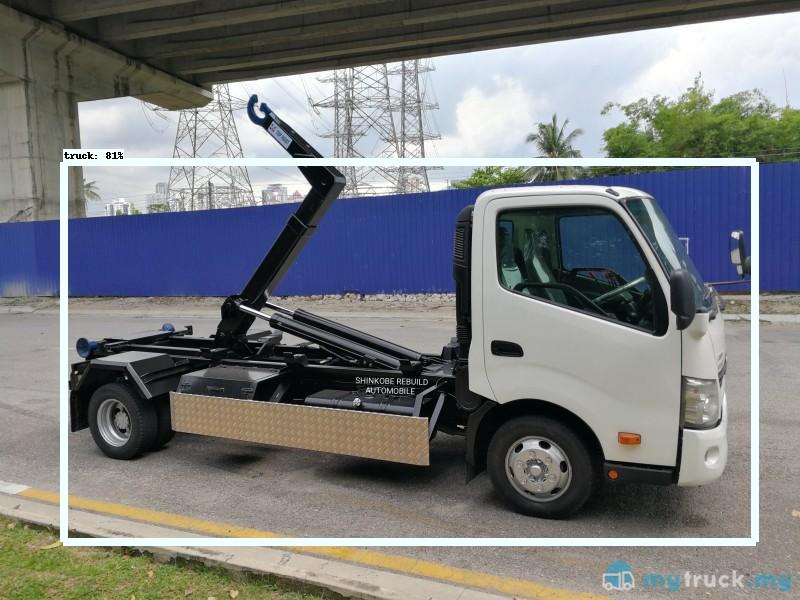

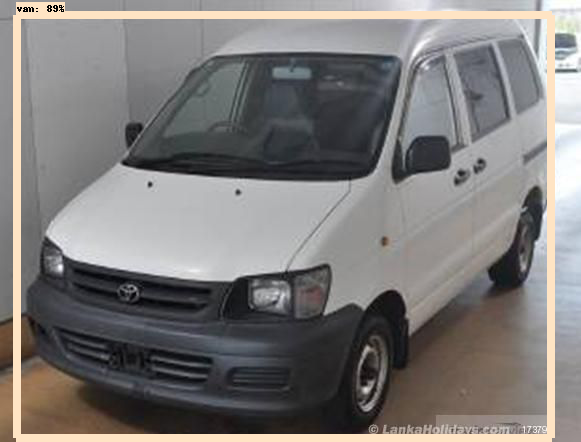

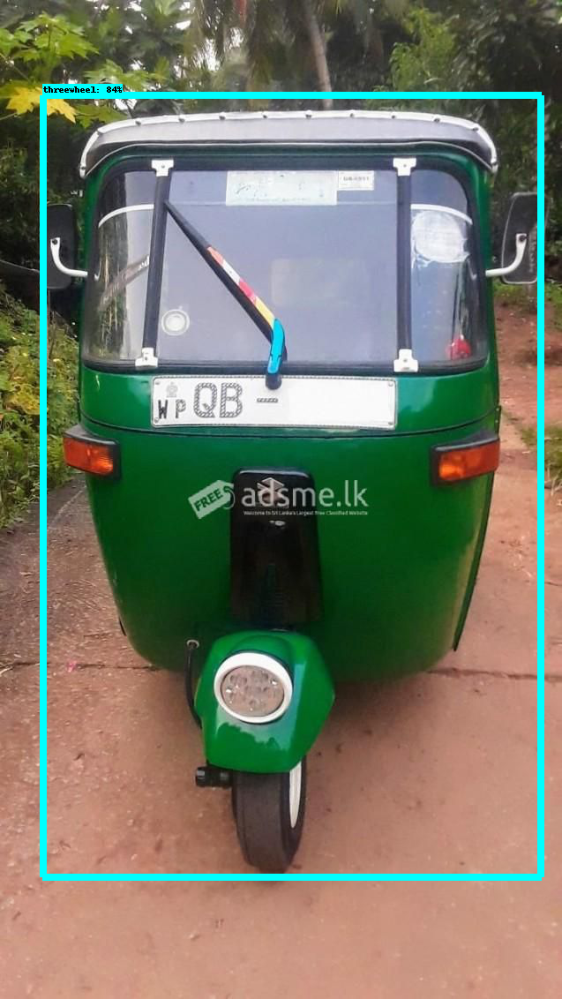

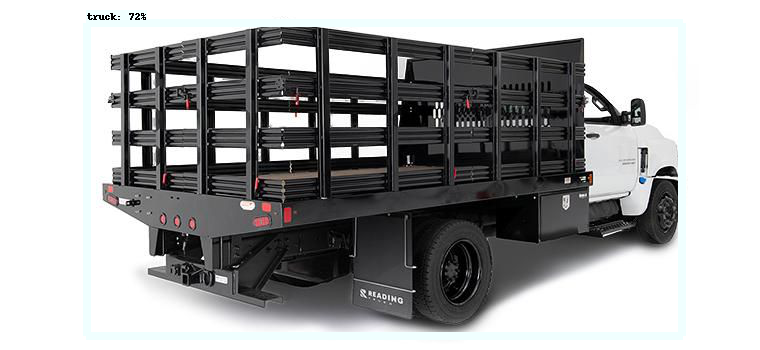

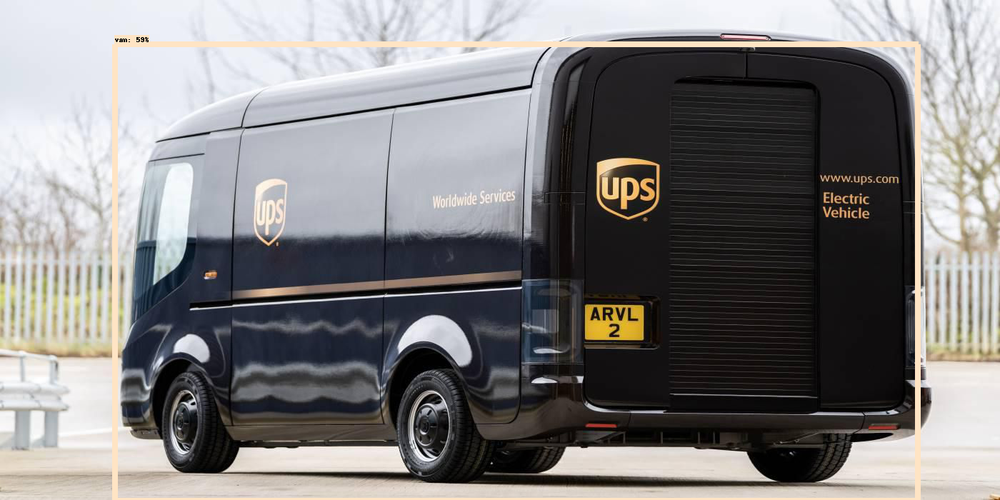

...

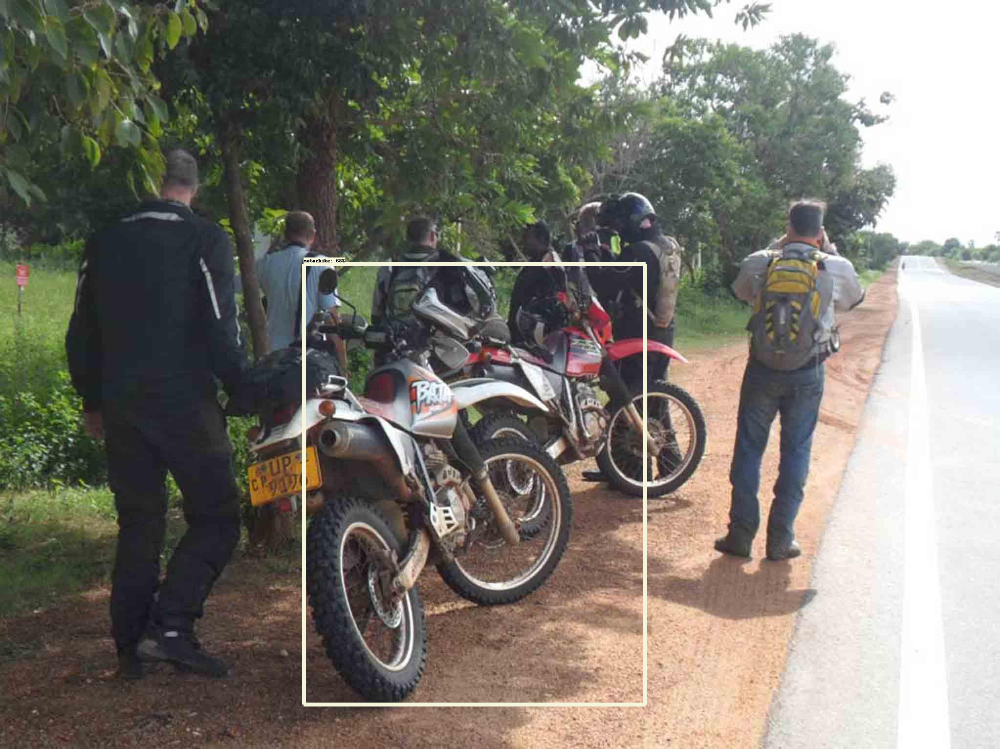

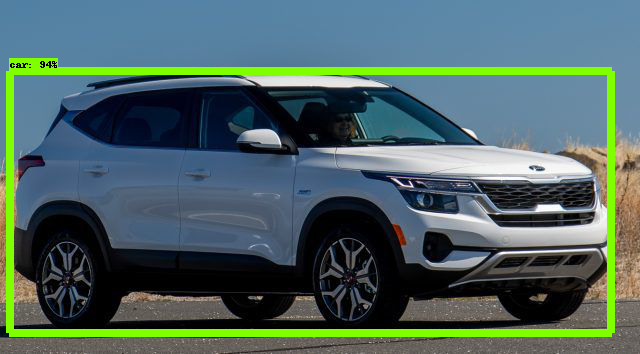

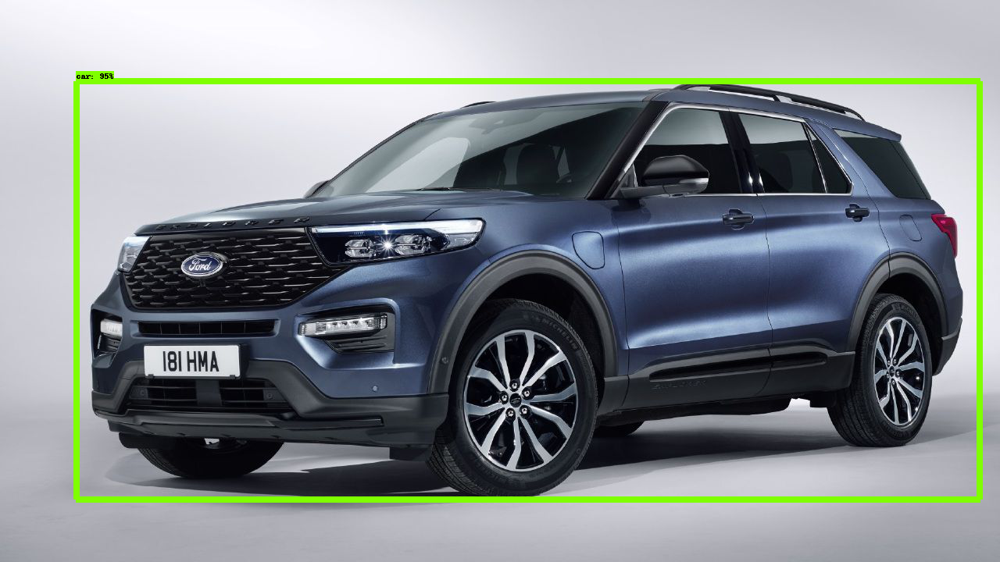

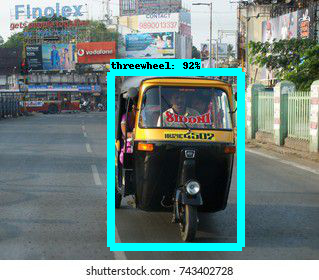

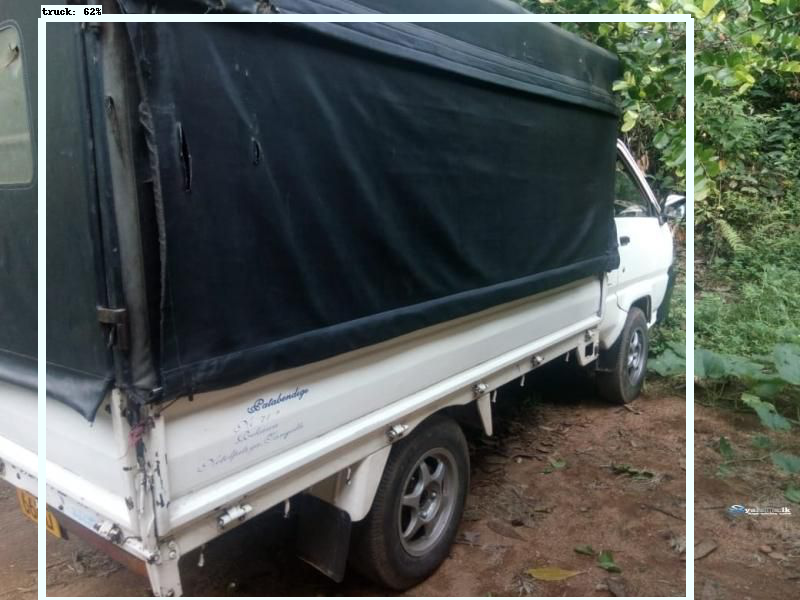

11.184163808822632


In [38]:
from google.colab.patches import cv2_imshow
from PIL import Image, ImageDraw
import cv2
import time
start_time = time.time()

for image_path in glob.glob('/content/Tensorflow-Object-Detection-API-Train-Model/images/test/*.jpg'):
  
  image_np = load_image_into_numpy_array(image_path)
  image_height, image_width, _ = image_np.shape
  output_dict = run_inference_for_single_image(model, image_np)
  output = []
  for index, score in enumerate(output_dict['detection_scores']):
      if score < 0.5:
          continue
      label = category_index[output_dict['detection_classes'][index]]['name']
      ymin, xmin, ymax, xmax = output_dict['detection_boxes'][index]
      output.append((label, int(xmin * image_width), int(ymin * image_height), int(xmax * image_width), int(ymax * image_height)))
  
  # Save incident (could be extended to send a email or something)
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      min_score_thresh=0.5,
      line_thickness=8)
  display(Image.fromarray(image_np))
  # out_path = "outputs/" + image_path.split("/")[-1]
  # cv2.imwrite(out_path,image_np)
end_time = time.time()
total_time = end_time - start_time
print(total_time)